# Chapter 9: Multi-Category Image Classifications



New Skills in This Chapter:

• Augmenting images through rotations, shifts, and flips

• One-hot encoding labels

• Choosing activation and loss functions in multi-category classifications

• Training, testing, and evaluating a deep neural network for multi-category classifications

***
*Learning to choose is hard. Learning to choose well is harder. And learning to
choose well in a world of unlimited possibilities is harder still, perhaps too hard.*
***
The Paradox of Choice: Why More Is Less

--Barry Schwartz

***

In [1]:
import os

os.makedirs("files/ch09", exist_ok=True)

# 9.1 Image Augmentations

## 9.1.1 The Keras Image Generator 


## 9.1.2 Visualize Image Augmentations

In [2]:
import numpy as np
import tensorflow as tf
import PIL

# Load the image from the folder
image=PIL.Image.open('files/ch09/horse.jpg')
pics=[]
# Convert the image to a numpy array
nparray=np.asarray(image)
nparray=np.expand_dims(nparray,0)
for i in range(20):
    datagen=tf.keras.preprocessing.image.ImageDataGenerator(
        rescale=1./255,
        featurewise_center=True,
        featurewise_std_normalization=True,
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True)
    img_iterator=datagen.flow(nparray,batch_size=1)
    pic=img_iterator.next()
    pics.append(pic)

C:\Users\hlliu2\Anaconda3\envs\deepq\lib\site-packages\keras\preprocessing\image.py:1663: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
C:\Users\hlliu2\Anaconda3\envs\deepq\lib\site-packages\keras\preprocessing\image.py:1671: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


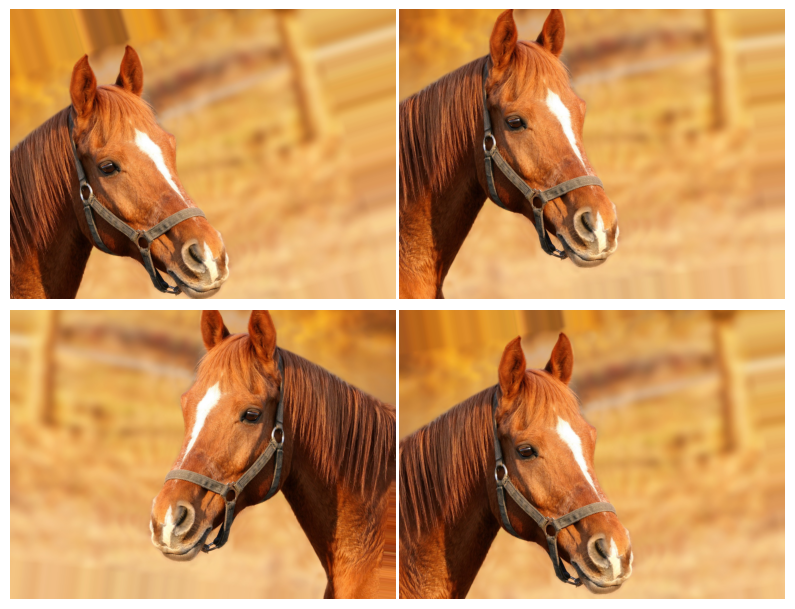

In [3]:
import matplotlib.pyplot as plt
from random import choice

plt.figure(figsize=(10,10),dpi=100)
for i in range(2):
    for j in range(2):
        plt.subplot(2,2, 2*i+j+1)
        idx=choice(range(20))
        plt.imshow(pics[idx][0])
        plt.axis('off')
plt.subplots_adjust(wspace=0.01,hspace=-0.36)
plt.show()

# 9.2 What Is Multi-Category Classification?

## 9.2.1 One-Hot Encoder for Labels


In [4]:
labels=[0,4,9]
y=tf.keras.utils.to_categorical(labels,10)
print(y)

[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]


## 9.2.2 The Activation and Loss Functions

# 9.3 Train the Multi-Category Classification Model 

## 9.3.1 Load the Full Data Set

In [5]:
import pickle

def unpickle(file):
    with open(file, 'rb') as fo:
        dict=pickle.load(fo, encoding='bytes')
    return dict

X=np.array([]).reshape(-1,32,32,3)
y=np.array([]).reshape(-1,)
path="files/ch07/cifar10/cifar-10-batches-py"

for n in (1,2,3,4,5):
    dn=unpickle(f"{path}/data_batch_{n}")
    Xn=dn[b"data"].reshape(10000,3,32,32)
    Xn=Xn.transpose(0,2,3,1)/255
    yn=np.array(dn[b'labels'])
    # concatenate the batches
    X=np.concatenate((X,Xn),axis=0)
    y=np.concatenate((y,yn),axis=0)   
X_train=X.reshape(-1,32,32,3)
y_train=y.reshape(-1,)

# load the test data set
test=unpickle(f"{path}/test_batch")
X_test=test[b"data"].reshape(10000,3,32,32)
X_test=X_test.transpose(0,2,3,1)/255
y_test=np.array(test[b'labels'])

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(50000, 32, 32, 3)
(50000,)
(10000, 32, 32, 3)
(10000,)


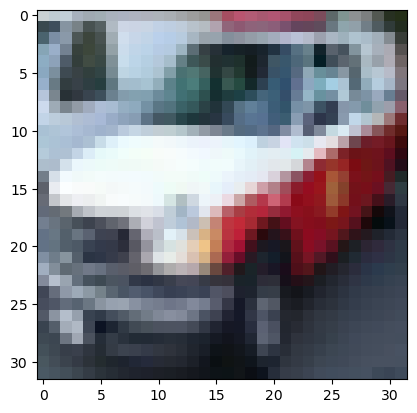

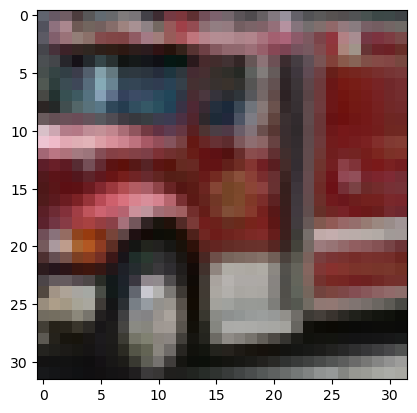

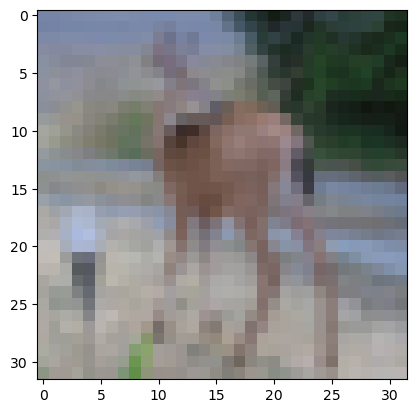

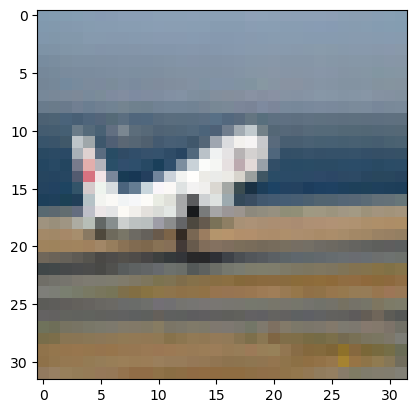

In [6]:
plt.imshow(X_train[60])
plt.show()  
plt.imshow(X_train[88])  
plt.show()
plt.imshow(X_test[100])
plt.show()  
plt.imshow(X_test[868])  
plt.show()

Run the code and you'll see four images. The first wo are from train: one is a car and the other a truck. The last wo are from tgest: one deer and one plane

## 9.3.2 Convert Labels to One-Hot Variables
Next, we'll one-hot encode the labels so that the neural network can process them. 

In [7]:
y_train=tf.keras.utils.to_categorical(y_train,10)
y_test=tf.keras.utils.to_categorical(y_test,10)

In [8]:
print(y_train.shape)
print(y_train[0:5])
print(y_test.shape)
print(y_test[0:5])

(50000, 10)
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
(10000, 10)
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]


## 9.3.3 Train the Model


In [9]:
# Create the model
from tensorflow.keras import layers

tf.random.set_seed(0)
dnn=tf.keras.Sequential()
dnn.add(layers.Conv2D(filters=64,kernel_size=(3,3),\
      activation="relu",input_shape=(32,32,3)))
dnn.add(layers.MaxPooling2D(pool_size=(2,2)))
dnn.add(layers.Conv2D(filters=32,kernel_size=(3,3),
      activation="relu"))
dnn.add(layers.MaxPooling2D(pool_size=(2,2)))
dnn.add(layers.Flatten())
dnn.add(layers.Dense(units=128,activation="relu"))
dnn.add(layers.Dropout(rate=0.2))
dnn.add(layers.Dense(10,activation='softmax'))
dnn.compile(optimizer=\
    tf.keras.optimizers.RMSprop(learning_rate=0.0001), 
    loss="categorical_crossentropy",
    metrics=["accuracy"])

In [10]:
datagen=tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True)
datagen.fit(X_train)
training_data=datagen.flow(X_train,y_train)

# Save the model after each five epochs of training
dnn.save('files/ch09/multi_epoch0.h5')
for i in range(1,26,1):
    dnn.fit(training_data,verbose=0,epochs=5)
    dnn.save(f'files/ch09/multi_epoch{i*5}.h5')

The above model takes about an hour to train.

## Evaluate the Model
Now that the model is trained, we can evaluate the performance of the model during the training process.

In [11]:
print(dnn.evaluate(X_train, y_train))
print(dnn.evaluate(X_test, y_test))

1563/1563 [==============================] - 11s 7ms/step - loss: 0.8548 - accuracy: 0.7201
[0.8548417687416077, 0.7201399803161621]
313/313 [==============================] - 2s 7ms/step - loss: 0.9317 - accuracy: 0.7020
[0.9317433834075928, 0.7020000219345093]


313/313 [==============================] - 2s 7ms/step - loss: 0.9317 - accuracy: 0.7020


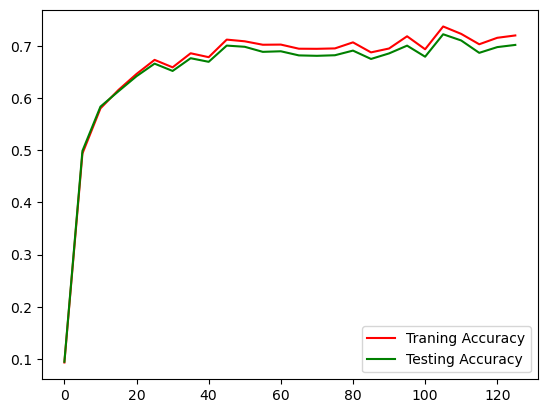

In [12]:
epochs = []
train_accuracy =[]
test_accuracy =[]
for i in range(26):
    epochs.append(i*5)
    file=f'files/ch09/multi_epoch{i*5}.h5'
    model=tf.keras.models.load_model(file)
    # Accuracy on the training dataset
    train_acc=model.evaluate(X_train,y_train)[1]
    train_accuracy.append(train_acc)
    # Accuracy on the testing dataset
    test_acc=model.evaluate(X_test,y_test)[1]
    test_accuracy.append(test_acc)    
# Plot the accuracies
plt.plot(epochs,train_accuracy,
         label='Traning Accuracy',color="r")
plt.plot(epochs,test_accuracy,
         label='Testing Accuracy',color="g")
plt.legend()
plt.show()

The accuracy score is above 70% for both the training and testing dataset after about 10 epochs of training.

# 9.4 Animate the Learning Process

## 9.4.1 Select Example Pictures
We'll select two example pictures from the test data set.

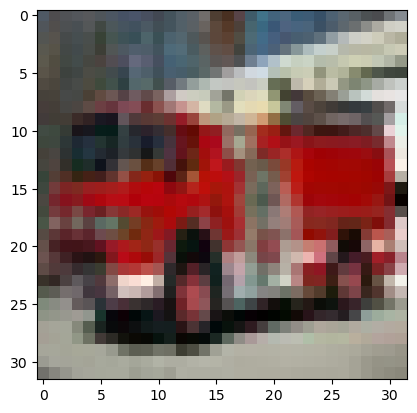

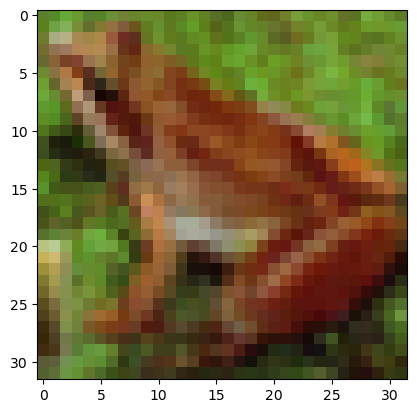

In [13]:
# Select a picture of a truck
truck=X_test[23]
# Select a picture of a frog
frog=X_test[29]
# Visualize them
plt.imshow(truck)
plt.show()
plt.imshow(frog)
plt.show()

In [14]:
with open('files/ch09/truck_frog.p', 'wb') as fp:
    pickle.dump((truck, frog), fp)

## 9.4.2 Animate the Prediction Changes

In [15]:
from utils.ch09util import p_truck

# Call the p_truck function and geneate 26 pictures
p_truck(truck)

If you go to the local folder and open the file p_truck0.png, you'll see a picture as follows:
<img src="https://gattonweb.uky.edu/faculty/lium/ml/p_truck0.png" />
It shows that before training starts, the model puts a 12.17% probability that the picture is a truck. In contrast, if you open the file p_truck25.png, you'll see a picture as follows:
<img src="https://gattonweb.uky.edu/faculty/lium/ml/p_truck25.png" />
It shows that after 125 epochs of training, the model puts a 98.76% probability that the picture is a truck. 

In [16]:
import imageio

frames=[] 
for stage in range(26):
    frame=PIL.Image.open(f"files/ch09/p_truck{stage}.png")  
    frame=np.asarray(frame)
    frames.append(frame) 
imageio.mimsave('files/ch09/p_truck.gif', frames, duration=500) 

You can see the animation in the local folder, which looks like this:
<img src="https://gattonweb.uky.edu/faculty/lium/ml/p_truck.gif" /> 

## 9.4.3 Subplots of the Predictions on the Truck Image


In [17]:
pics=["0","3","9","12","15","18","21","25"]
plt.figure(figsize=(24,32),dpi=300)
for i in range(8):
    plt.subplot(4,2,i+1)
    file=f"files/ch09/p_truck{pics[i]}.png"
    frame=PIL.Image.open(file)
    plt.imshow(frame)
    plt.axis('off')
plt.subplots_adjust(bottom=0.001,right=0.999,top=0.999,
        left=0.001, hspace=-0.16,wspace=-0.02)
plt.savefig("files/ch09/p_truck.png")

## 9.4.4 Animation Predictions on the Frog Image

In [18]:
from utils.ch09util import p_frog

p_frog(frog)

In [19]:
frames=[] 
for stage in range(26):
    frame=PIL.Image.open(f"files/ch09/p_frog{stage}.png")  
    frame=np.asarray(frame)
    frames.append(frame) 
imageio.mimsave('files/ch09/p_frog.gif', frames, duration=500) 

You can see the animation in the local folder, which looks like this:
<img src="https://gattonweb.uky.edu/faculty/lium/ml/p_frog.gif" /> 

Before training starts, the model puts a 8.78% probability that the picture is a frog. After 125 epochs of training, the model puts a 99.86% probability that the picture is a frog. 

## 9.4.5 Subplots of the Predictions on the Frog Image

In [20]:
plt.figure(figsize=(24,32),dpi=300)
for i in range(8):
    plt.subplot(4,2,i+1)
    file=f"files/ch09/p_frog{pics[i]}.png"
    frame=PIL.Image.open(file)
    plt.imshow(frame)
    plt.axis('off')
plt.subplots_adjust(bottom=0.001,right=0.999,top=0.999,
        left=0.001, hspace=-0.16,wspace=-0.02)
plt.savefig("files/ch09/p_frog.png")

## 9.4.6 Combine the Animations


In [21]:
frames=[] 
for stage in range(26):
    frame1=PIL.Image.open(f"files/ch09/p_truck{stage}.png")  
    frame1=np.asarray(frame1)
    frame2=PIL.Image.open(f"files/ch09/p_frog{stage}.png")  
    frame2=np.asarray(frame2) 
    frame=np.concatenate([frame1,frame2],axis=1)
    frames.append(frame) 
imageio.mimsave('files/ch09/p_truck_frog.gif',frames,duration=500) 

You can see the animation in the local folder, which looks like this:
<img src="https://gattonweb.uky.edu/faculty/lium/ml/p_truck_frog.gif" /> 

# 9.6 Exercises

In [22]:
# answer to question 9.4
import numpy as np
import tensorflow as tf
import PIL

# Load the image from the folder
image=PIL.Image.open('files/ch09/horse.jpg')
pics=[]
# Convert the image to a numpy array
nparray=np.asarray(image)
nparray=np.expand_dims(nparray,0)
for i in range(30):
    datagen=tf.keras.preprocessing.image.ImageDataGenerator(
        rescale=1./255,
        featurewise_center=True,
        featurewise_std_normalization=True,
        rotation_range=30,
        width_shift_range=0.15,
        height_shift_range=0.1,
        horizontal_flip=True)
    img_iterator=datagen.flow(nparray,batch_size=1)
    pic=img_iterator.next()
    pics.append(pic)

In [23]:
# answer to question 9.5
three_labels=[1,5,7]
y3=tf.keras.utils.to_categorical(three_labels,10)
print(y3)

[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
